In [1]:
import mne
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from metadata import *

print(subject_list)
print(EOG_channels)

['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '015', '016', '021', '022', '024', '025', '027', '029', '030', '031', '032', '033']
['EXG3', 'EXG4', 'EXG5']
C:\Users\DELL\AppData\Local\Programs\Python\Python37\lib\site-packages\mne\utils\docs.py:830: DeprecationWarning: Function read_montage is deprecated; ``read_montage`` is deprecated and will be removed in v0.20. Please use ``read_dig_fif``, ``read_dig_egi``, ``read_custom_montage``, or ``read_dig_captrack`` to read a digitization based on your needs instead; or ``make_standard_montage`` to create ``DigMontage`` based on template; or ``make_dig_montage`` to create a ``DigMontage`` out of np.arrays
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\DELL\AppData\Local\Programs\Python\Python37\lib\site-packages\mne\utils\docs.py:813: DeprecationWarning: Class Montage is deprecated; Montage class is deprecated and will be removed in v0.20. Please use DigMontage instead.
  warnings.warn(msg, c

In [3]:
# HELPTER FUNCTIONS

def read_data(subject): 
    print('# Reading Raw and ICA data...')
    raw = mne.io.read_raw_fif(filtered_files[subject], preload=True)
    ica = mne.preprocessing.read_ica(ica_files[subject])
    ica.exclude = [] # default to empty list
    return raw, ica

def show_ics(subject): 
    %matplotlib qt
    raw, ica = read_data(subject)
    ica.plot_sources(raw)

# read more on https://mne.tools/dev/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA.find_bads_eog
def auto_detect_eog(subject, raw, ica, EOG): 
    print('# Finding ICs that match patterns in EOG channels...')
    exclude = set()
    for channel in EOG: 
        if (channel in raw.info['bads']): # skip bad channels
            continue
        eog_indices, eog_scores = ica.find_bads_eog(
            raw, 
            ch_name = channel
        )
        ica.plot_scores(eog_scores)
        exclude.update(eog_indices)
    print('# Exclude EOG:', exclude)
    return exclude

# read more on https://mne.tools/dev/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA.find_bads_ecg
def auto_detect_ecg(subject, raw, ica, ECG): 
    print('# Finding ICs that match patterns in ECG channels...')
    exclude = set()
    for channel in ECG: 
        if (channel in raw.info['bads']): # skip bad channels
            continue
        ecg_indices, ecg_scores = ica.find_bads_ecg(
            raw, 
            ch_name = channel
        )
        ica.plot_scores(ecg_scores)
        exclude.update(ecg_indices)
    print('# Exclude ECG:', exclude)
    return exclude

def reject(subject, EOG, ECG, noise): 
    %matplotlib inline
    print('##### Processing subject', subject, '...')
    raw, ica = read_data(subject)
    print('# Running auto detection...')
    exclude_eog = auto_detect_eog(subject, raw, ica, EOG)
    exclude_ecg = auto_detect_ecg(subject, raw, ica, ECG)
    exclude_auto = exclude_eog.union(exclude_eog)
    print('# Auto Exclude:', exclude_auto)
    exclude_list = list(exclude_auto.union(set(noise))) # automatically detected + manually included
    print('# Exclude list:', exclude_list)
    ica.exclude = exclude_list
    print('# Visualizing noise reduction...')
    picks = EEG_channels
    for bad in raw.info['bads']: 
        if (bad in picks): 
            picks.remove(bad)
    ica.plot_overlay(raw, picks = picks)
    print("# Saving the updated data...")
    raw_after_ica = ica.apply(raw, exclude = ica.exclude)
    raw_after_ica.save(ica_after_files[subject], overwrite = True)
    print('Done!')

In [4]:
'''
FOR EACH SUBJECT, DROP BAD COMPONENTS.  

subejct: subject_id
EOG_list: already specified by EOG_channels in "metadata" file: ['EXG3', 'EXG4', 'EXG5']
ECG_list: default to be empty
noise_list: manually specified by inspecting visualizations of independent components

finally just run: reject(subject, EOG_channels, ECG_list, noise_list)
'''

'\nFOR EACH SUBJECT, DROP BAD COMPONENTS.  \n\nsubejct: subject_id\nEOG_list: already specified by EOG_channels in "metadata" file: [\'EXG3\', \'EXG4\', \'EXG5\']\nECG_list: default to be empty\nnoise_list: manually specified by inspecting visualizations of independent components\n\nfinally just run: reject(subject, EOG_channels, ECG_list, noise_list)\n'

##### Processing subject 001 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/001_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 638591 =      0.000 ...  4988.992 secs
Ready.
Reading 0 ... 638591  =      0.000 ...  4988.992 secs...
Reading F:/HoltLab/data/ica/001_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

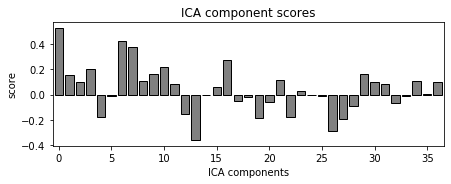

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

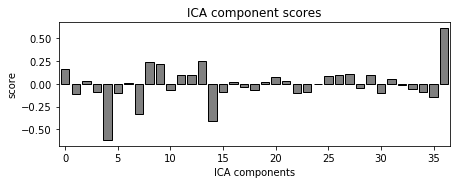

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

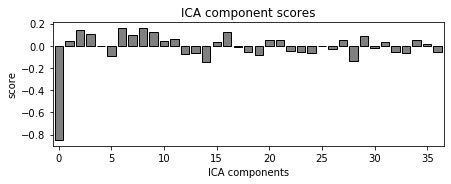

# Exclude EOG: {0, 4, 36}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 4, 36}
# Exclude list: [0, 1, 35, 4, 36, 5, 7, 8, 9, 16]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 10 ICA components


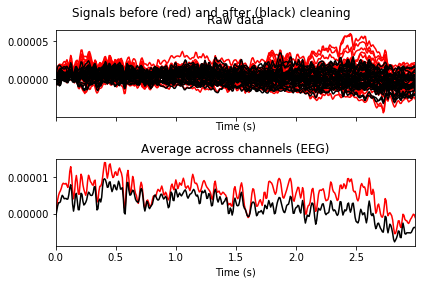

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 10 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\001_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\001_after_ica.fif [done]
Done!


In [9]:
subject = '001'
ECG_list = []
noise_list = [1, 5, 7, 8, 9, 16, 35, 36] # eye: 1, 5, 7; muscle: 8, 9; noise: 35, 36
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 002 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/002_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 633343 =      0.000 ...  4947.992 secs
Ready.
Reading 0 ... 633343  =      0.000 ...  4947.992 secs...
Reading F:/HoltLab/data/ica/002_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

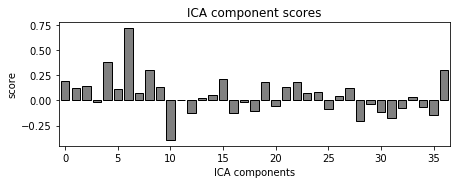

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

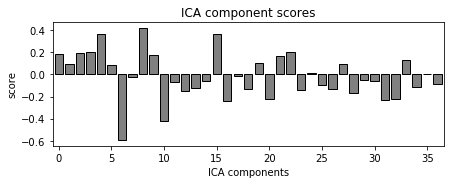

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

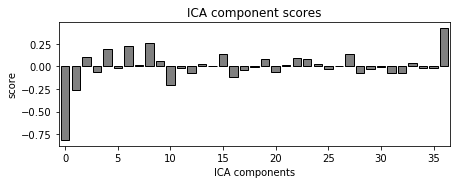

# Exclude EOG: {0, 36, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 36, 6}
# Exclude list: [0, 1, 36, 4, 6, 8, 9, 28]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 8 ICA components


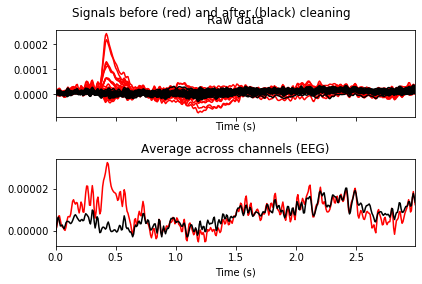

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 8 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\002_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\002_after_ica.fif [done]
Done!


In [16]:
subject = '002'
ECG_list = []
noise_list = [1, 4, 8, 9, 28, 36] # eye: 1; muscle: 4, 8, 9, 28; noise: 36
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 003 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/003_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 615295 =      0.000 ...  4806.992 secs
Ready.
Reading 0 ... 615295  =      0.000 ...  4806.992 secs...
Reading F:/HoltLab/data/ica/003_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

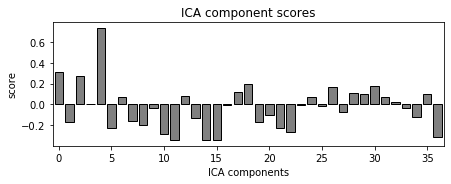

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

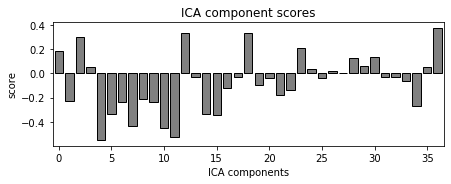

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

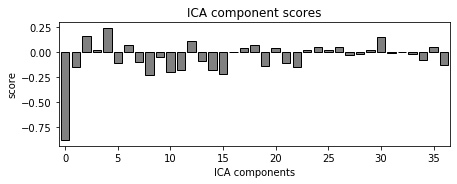

# Exclude EOG: {0, 4}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 4}
# Exclude list: [0, 4, 36, 6, 7, 12, 13, 17, 22, 23, 26, 28, 29]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 13 ICA components


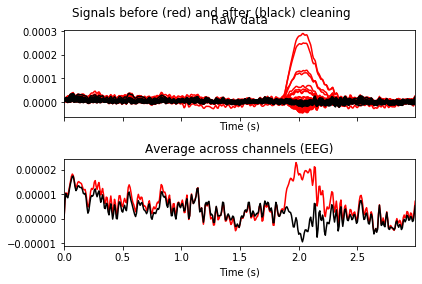

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 13 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\003_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\003_after_ica.fif [done]
Done!


In [15]:
subject = '003'
ECG_list = []
noise_list = [6, 7, 12, 13, 17, 22, 23, 26, 28, 29, 36] # eye: 6, 17; muscle: 7, 12, 13, 22, 36; noise: 23, 26, 28, 29
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 004 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/004_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 643327 =      0.000 ...  5025.992 secs
Ready.
Reading 0 ... 643327  =      0.000 ...  5025.992 secs...
Reading F:/HoltLab/data/ica/004_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

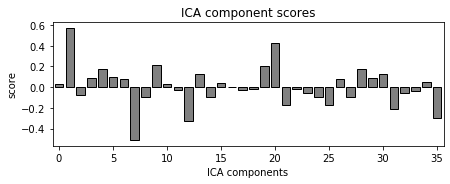

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

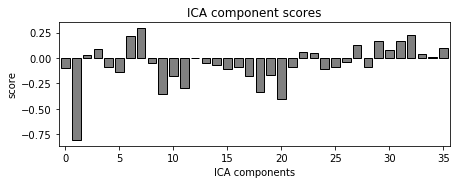

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

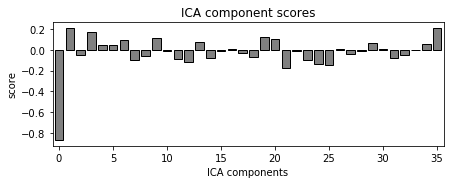

# Exclude EOG: {0, 1}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 1}
# Exclude list: [0, 1, 35, 7, 8, 12, 20, 21, 23]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components


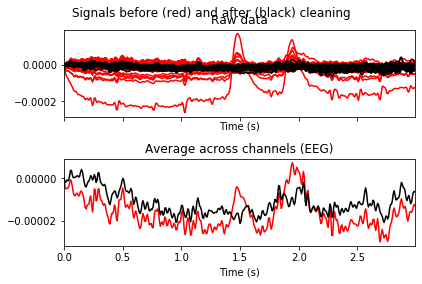

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\004_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\004_after_ica.fif [done]
Done!


In [34]:
subject = '004'
ECG_list = []
noise_list = [7, 8, 12, 20, 21, 23, 35] # eye: 7, 12, 20, 35; noise: 8, 21, 23
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 005 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/005_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 627711 =      0.000 ...  4903.992 secs
Ready.
Reading 0 ... 627711  =      0.000 ...  4903.992 secs...
Reading F:/HoltLab/data/ica/005_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

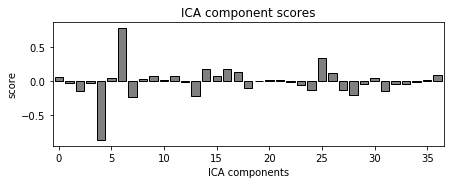

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

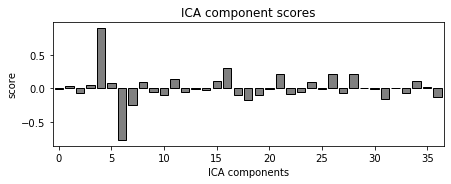

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

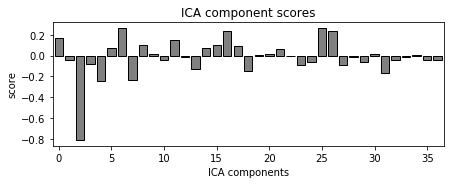

# Exclude EOG: {2, 4, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {2, 4, 6}
# Exclude list: [0, 1, 2, 34, 4, 3, 6, 36, 9, 22, 30, 31]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 12 ICA components


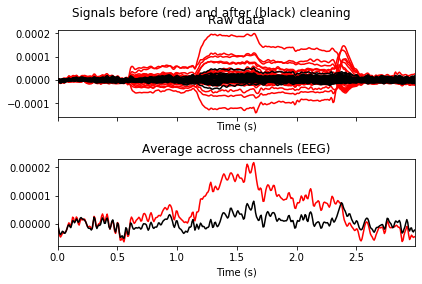

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 12 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\005_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\005_after_ica.fif [done]
Done!


In [37]:
subject = '005'
ECG_list = []
noise_list = [0, 1, 3, 9, 22, 30, 31, 34, 36] # muscle: 22, 31, 34, 36; noise: 0, 1, 3, 9, 30
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 006 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/006_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 843647 =      0.000 ...  6590.992 secs
Ready.
Reading 0 ... 843647  =      0.000 ...  6590.992 secs...
Reading F:/HoltLab/data/ica/006_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

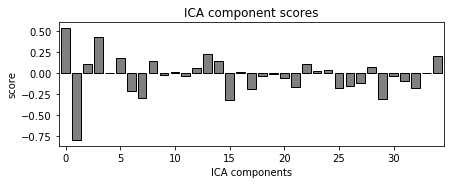

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

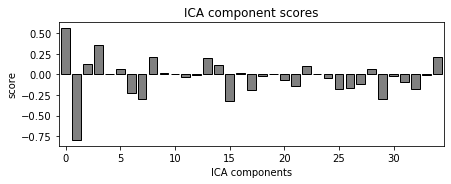

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

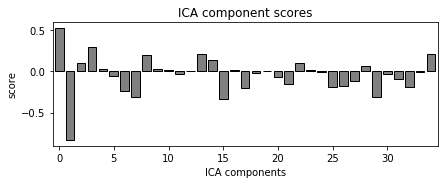

# Exclude EOG: {0, 1}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 1}
# Exclude list: [0, 1, 2, 3, 4, 5, 34, 10, 18, 19, 20, 24, 25]
# Visualizing noise reduction...
Transforming to ICA space (35 components)
Zeroing out 13 ICA components


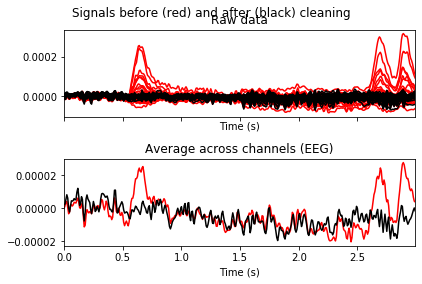

# Saving the updated data...
Transforming to ICA space (35 components)
Zeroing out 13 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\006_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\006_after_ica.fif [done]
Done!


In [38]:
subject = '006'
ECG_list = []
noise_list = [2, 3, 4, 5, 10, 18, 19, 20, 24, 25, 34] # eye: 2, 4, 20, 24; muscle: 10, 18, 19, 25, 34; noise: 3, 5
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 007 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/007_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 779263 =      0.000 ...  6087.992 secs
Ready.
Reading 0 ... 779263  =      0.000 ...  6087.992 secs...
Reading F:/HoltLab/data/ica/007_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

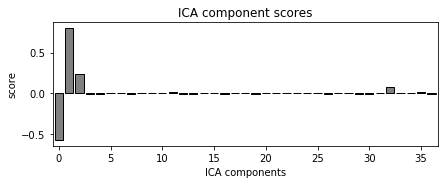

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

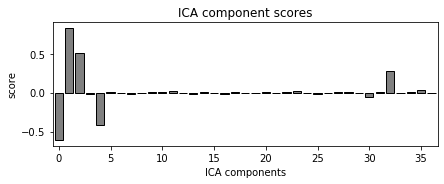

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

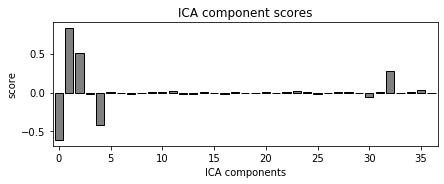

# Exclude EOG: {0, 1, 2, 4}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 1, 2, 4}
# Exclude list: [0, 1, 2, 4, 12, 16, 19, 22, 28]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components


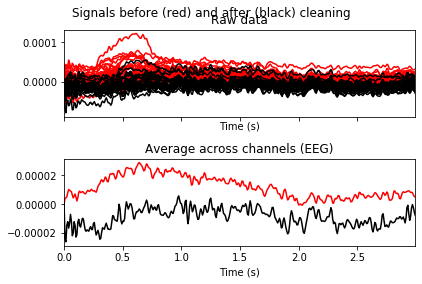

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\007_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\007_after_ica.fif [done]
Done!


In [17]:
subject = '007'
ECG_list = []
noise_list = [12, 16, 19, 22, 28] # eye: 16, 19, 28; muscle: 12; noise: 22
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 008 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/008_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 629759 =      0.000 ...  4919.992 secs
Ready.
Reading 0 ... 629759  =      0.000 ...  4919.992 secs...
Reading F:/HoltLab/data/ica/008_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

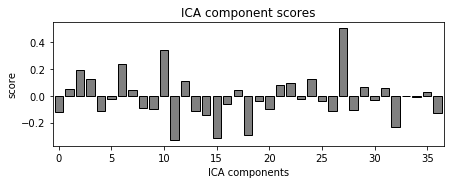

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

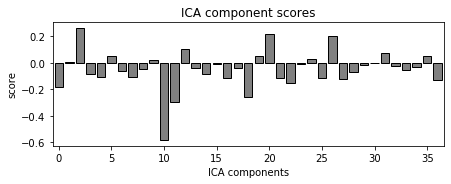

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

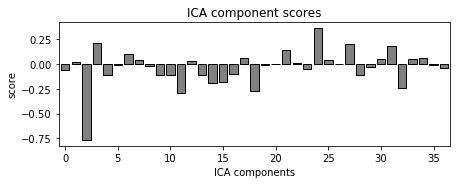

# Exclude EOG: {2, 10, 27}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {2, 10, 27}
# Exclude list: [32, 2, 6, 10, 19, 20, 26, 27, 31]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components


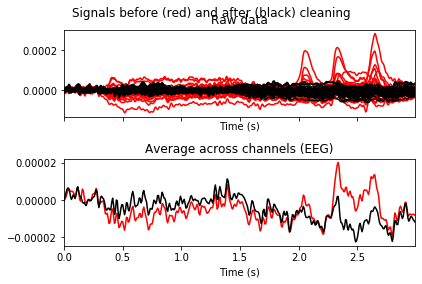

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\008_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\008_after_ica.fif [done]
Done!


In [21]:
subject = '008'
ECG_list = []
noise_list = [6, 19, 20, 26, 31, 32] # eye: 6, 26; muscle: 20, 31, 32; noise: 19
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 009 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/009_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 710911 =      0.000 ...  5553.992 secs
Ready.
Reading 0 ... 710911  =      0.000 ...  5553.992 secs...
Reading F:/HoltLab/data/ica/009_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

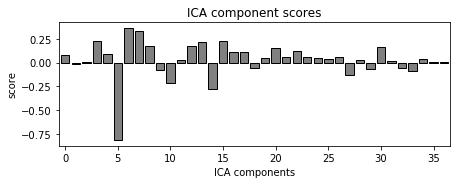

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

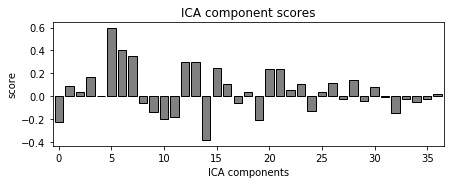

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

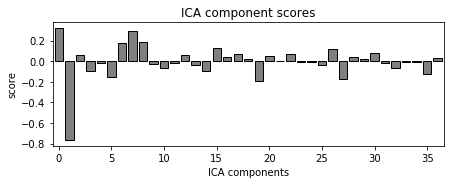

# Exclude EOG: {1, 5}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 5}
# Exclude list: [0, 1, 2, 3, 4, 5, 8, 9, 11, 19, 24]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 11 ICA components


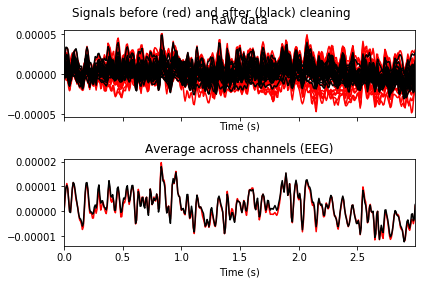

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 11 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\009_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\009_after_ica.fif [done]
Done!


In [25]:
subject = '009'
ECG_list = []
noise_list = [0, 2, 3, 4, 8, 9, 11, 19, 24]  # eye: 0, 4; muscle: 2, 3, 8, 9, 11, 24; noise: 19
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 010 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/010_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 679039 =      0.000 ...  5304.992 secs
Ready.
Reading 0 ... 679039  =      0.000 ...  5304.992 secs...
Reading F:/HoltLab/data/ica/010_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

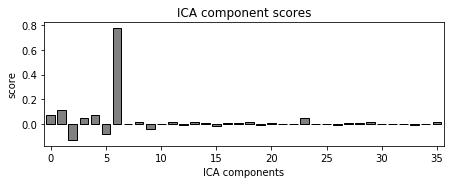

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

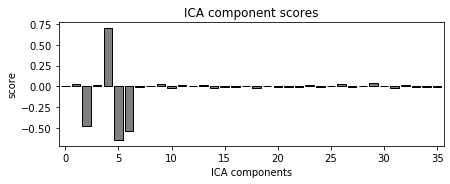

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

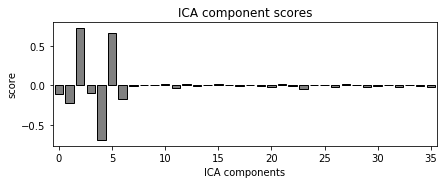

# Exclude EOG: {1, 2, 4, 5, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 2, 4, 5, 6}
# Exclude list: [0, 1, 2, 3, 4, 5, 6, 9, 11, 12, 13, 14, 17, 20, 21, 22, 23]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 17 ICA components


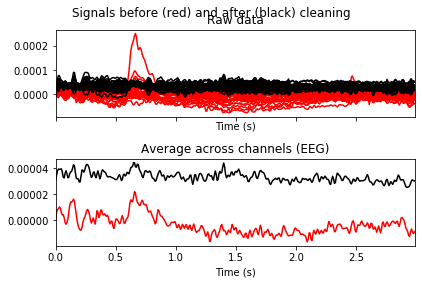

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 17 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\010_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\010_after_ica.fif [done]
Done!


In [29]:
subject = '010'
ECG_list = []
noise_list = [0, 3, 9, 11, 12, 13, 14, 17, 20, 21, 22, 23] # eye: 9, 11, 13, 20, 21; muscle: 12, 14, 17, 23; noise: 0, 3, 22
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 011 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/011_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 686975 =      0.000 ...  5366.992 secs
Ready.
Reading 0 ... 686975  =      0.000 ...  5366.992 secs...
Reading F:/HoltLab/data/ica/011_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

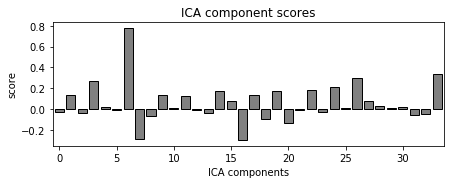

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

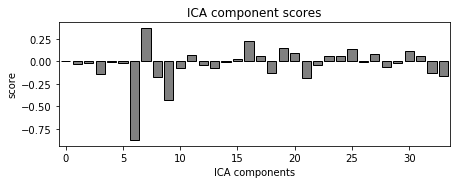

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

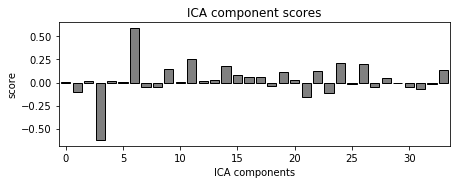

# Exclude EOG: {9, 3, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {9, 3, 6}
# Exclude list: [1, 33, 3, 6, 9, 11, 16, 19, 20, 24, 27]
# Visualizing noise reduction...
Transforming to ICA space (34 components)
Zeroing out 11 ICA components


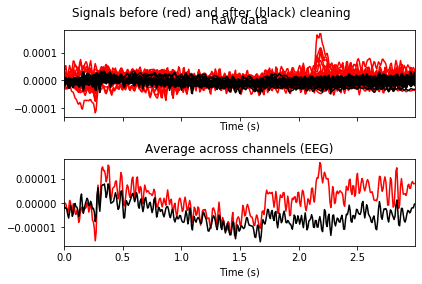

# Saving the updated data...
Transforming to ICA space (34 components)
Zeroing out 11 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\011_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\011_after_ica.fif [done]
Done!


In [35]:
subject = '011'
ECG_list = []
noise_list = [1, 11, 16, 19, 20, 24, 27, 33] # eye: 1; muscle: 11, 16, 19, 20, 24, 27, 33
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 012 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/012_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 628863 =      0.000 ...  4912.992 secs
Ready.
Reading 0 ... 628863  =      0.000 ...  4912.992 secs...
Reading F:/HoltLab/data/ica/012_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

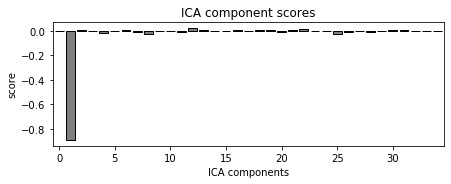

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

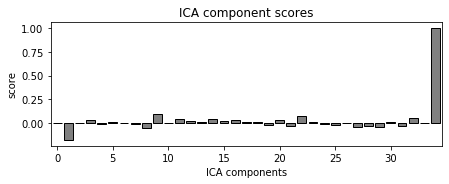

# Exclude EOG: {1, 34}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 34}
# Exclude list: [1, 34, 3, 4, 5, 7, 10, 25]
# Visualizing noise reduction...
Transforming to ICA space (35 components)
Zeroing out 8 ICA components


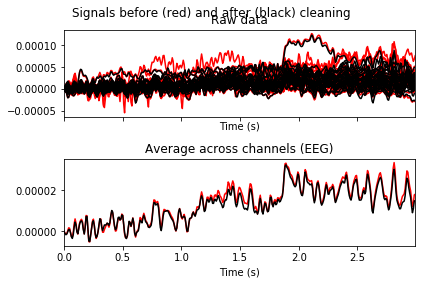

# Saving the updated data...
Transforming to ICA space (35 components)
Zeroing out 8 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\012_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\012_after_ica.fif [done]
Done!


In [41]:
subject = '012'
ECG_list = []
noise_list = [3, 4, 7, 10, 25] # eye: 3, 4, 7, 25; muscle: 10
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 015 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/015_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 632447 =      0.000 ...  4940.992 secs
Ready.
Reading 0 ... 632447  =      0.000 ...  4940.992 secs...
Reading F:/HoltLab/data/ica/015_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

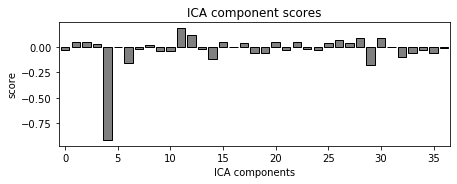

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

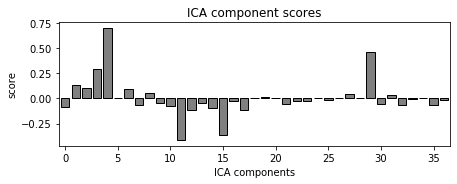

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

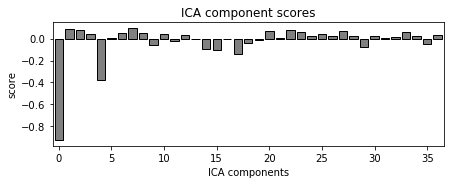

# Exclude EOG: {0, 4, 29}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 4, 29}
# Exclude list: [0, 4, 5, 13, 17, 18, 29]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 7 ICA components


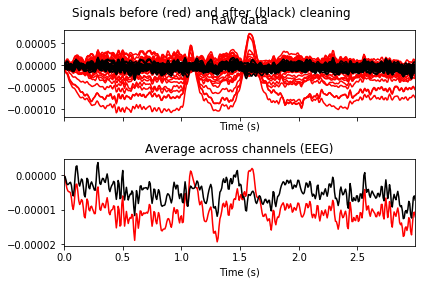

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 7 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\015_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\015_after_ica.fif [done]
Done!


In [9]:
subject = '015'
ECG_list = []
noise_list = [5, 13, 17, 18, 29] # eye: 17, 29; muscle: 18; noise: 5, 13
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 016 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/016_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 658815 =      0.000 ...  5146.992 secs
Ready.
Reading 0 ... 658815  =      0.000 ...  5146.992 secs...
Reading F:/HoltLab/data/ica/016_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

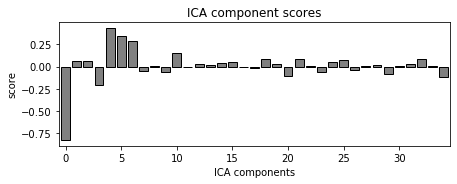

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

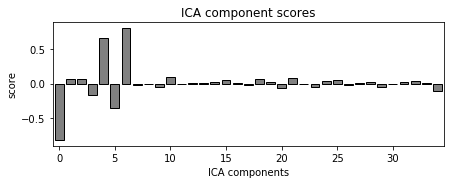

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

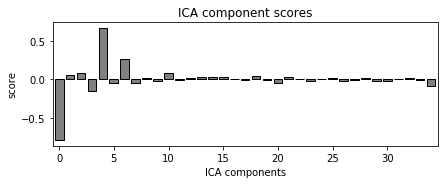

# Exclude EOG: {0, 4, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {0, 4, 6}
# Exclude list: [0, 1, 2, 4, 5, 6, 7, 8]
# Visualizing noise reduction...
Transforming to ICA space (35 components)
Zeroing out 8 ICA components


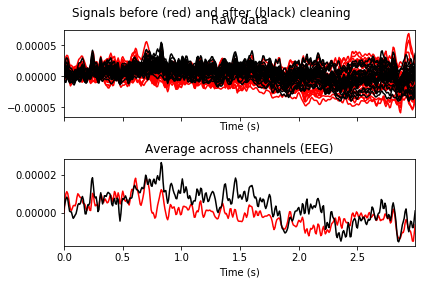

# Saving the updated data...
Transforming to ICA space (35 components)
Zeroing out 8 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\016_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\016_after_ica.fif [done]
Done!


In [13]:
subject = '016'
ECG_list = []
noise_list = [1, 2, 4, 5, 7, 8] # eye: 7, 8; noise: 1, 2, 3, 5; 
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 021 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/021_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 756863 =      0.000 ...  5912.992 secs
Ready.
Reading 0 ... 756863  =      0.000 ...  5912.992 secs...
Reading F:/HoltLab/data/ica/021_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

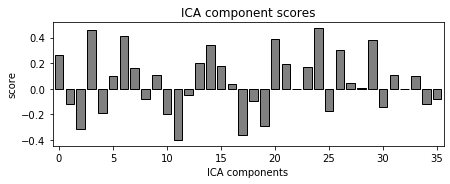

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

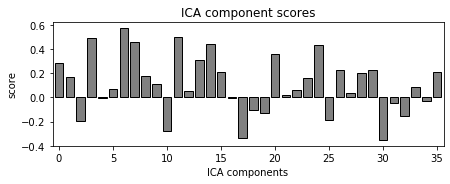

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

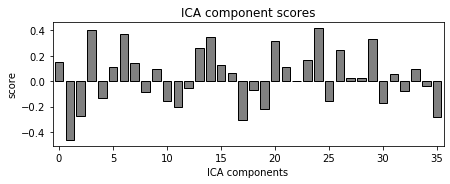

# Exclude EOG: set()
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: set()
# Exclude list: [2, 6, 11, 13, 30]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 5 ICA components


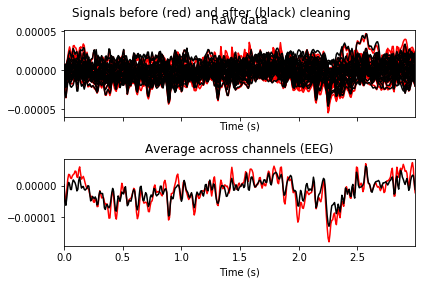

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 5 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\021_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\021_after_ica.fif [done]
Done!


In [17]:
subject = '021'
ECG_list = []
noise_list = [2, 6, 11, 13, 30] # eye: 2; muscle: 6, 11, 13, 30
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 022 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/022_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 660863 =      0.000 ...  5162.992 secs
Ready.
Reading 0 ... 660863  =      0.000 ...  5162.992 secs...
Reading F:/HoltLab/data/ica/022_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

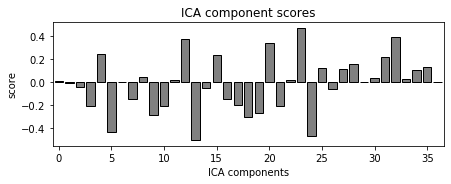

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

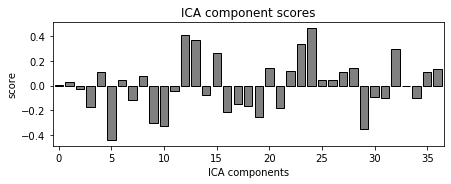

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

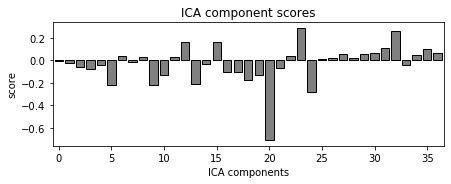

# Exclude EOG: {20}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {20}
# Exclude list: [0, 1, 2, 4, 7, 13, 14, 20, 26, 29]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 10 ICA components


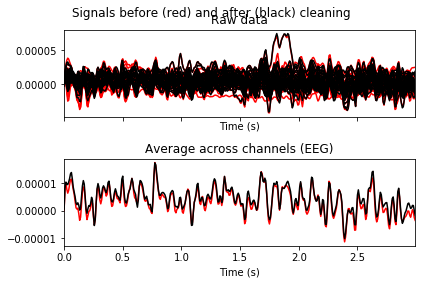

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 10 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\022_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\022_after_ica.fif [done]
Done!


In [26]:
subject = '022'
ECG_list = []
noise_list = [0, 1, 2, 4, 7, 13, 14, 26, 29] # muscle: 14, 26, 29; noise: 0, 1, 2, 4, 7, 13
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 024 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/024_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 629503 =      0.000 ...  4917.992 secs
Ready.
Reading 0 ... 629503  =      0.000 ...  4917.992 secs...
Reading F:/HoltLab/data/ica/024_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

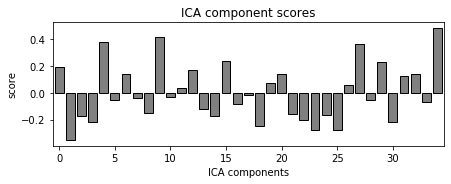

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

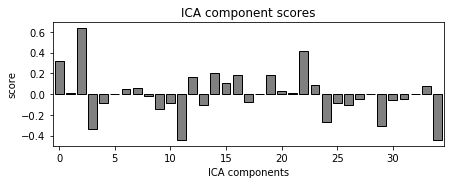

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

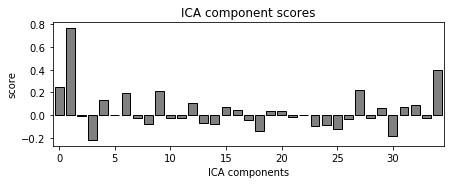

# Exclude EOG: {1, 2}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 2}
# Exclude list: [1, 2, 30]
# Visualizing noise reduction...
Transforming to ICA space (35 components)
Zeroing out 3 ICA components


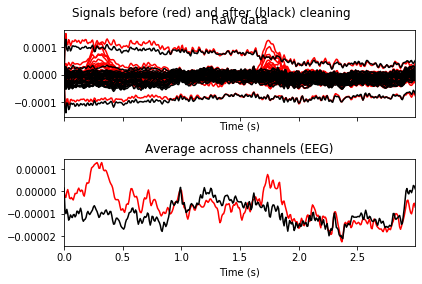

# Saving the updated data...
Transforming to ICA space (35 components)
Zeroing out 3 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\024_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\024_after_ica.fif [done]
Done!


In [6]:
subject = '024'
ECG_list = []
noise_list = [30] # muscle: 30
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 025 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/025_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 647679 =      0.000 ...  5059.992 secs
Ready.
Reading 0 ... 647679  =      0.000 ...  5059.992 secs...
Reading F:/HoltLab/data/ica/025_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

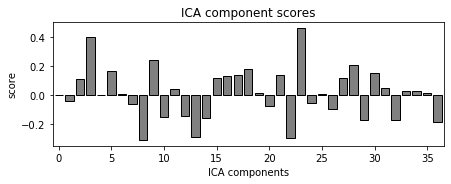

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

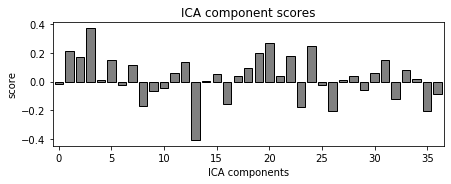

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

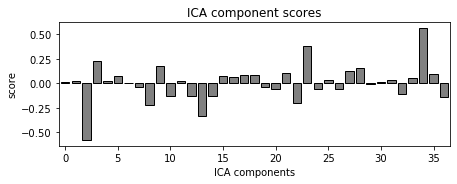

# Exclude EOG: {2, 34}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {2, 34}
# Exclude list: [0, 1, 2, 34, 4, 12, 28]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 7 ICA components


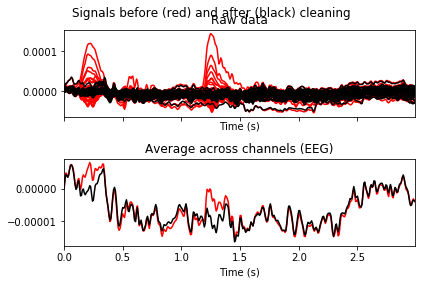

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 7 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\025_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\025_after_ica.fif [done]
Done!


In [11]:
subject = '025'
ECG_list = []
noise_list = [0, 1, 4, 12, 28, 34] # eye: 12; muscle: 28; noise: 0, 1, 4, 34
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 027 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/027_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 607871 =      0.000 ...  4748.992 secs
Ready.
Reading 0 ... 607871  =      0.000 ...  4748.992 secs...
Reading F:/HoltLab/data/ica/027_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

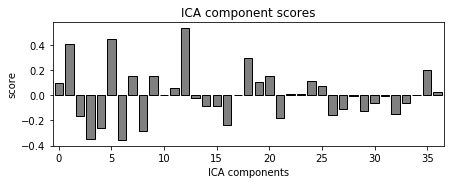

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

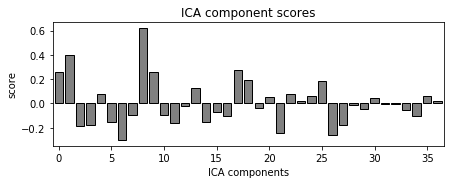

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

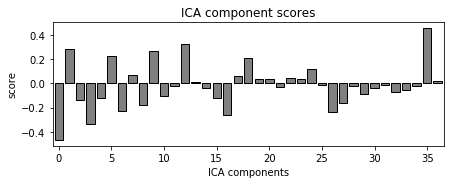

# Exclude EOG: {8}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {8}
# Exclude list: [0, 36, 7, 8, 11, 12, 14, 26, 30]
# Visualizing noise reduction...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components


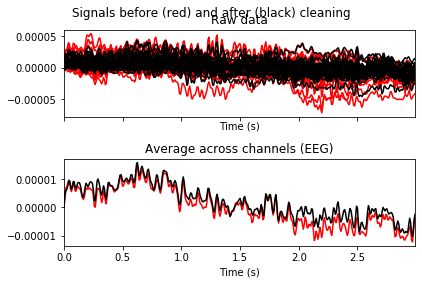

# Saving the updated data...
Transforming to ICA space (37 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\027_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\027_after_ica.fif [done]
Done!


In [17]:
subject = '027'
ECG_list = []
noise_list = [0, 7, 8, 11, 12, 14, 26, 30, 36] # eye: 0; muscle: 7, 8, 11, 12, 14, 26, 30; noise: 36
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 029 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/029_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 675455 =      0.000 ...  5276.992 secs
Ready.
Reading 0 ... 675455  =      0.000 ...  5276.992 secs...
Reading F:/HoltLab/data/ica/029_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

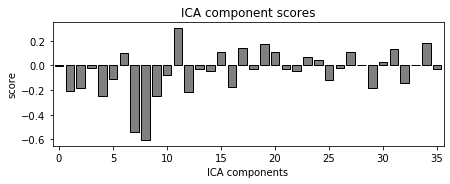

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

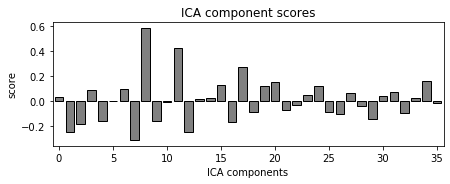

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

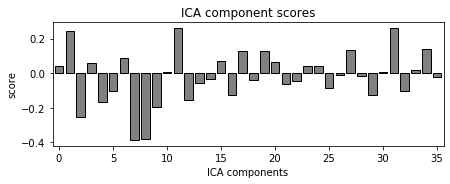

# Exclude EOG: {8, 7}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {8, 7}
# Exclude list: [0, 1, 32, 3, 35, 7, 8, 13, 31]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components


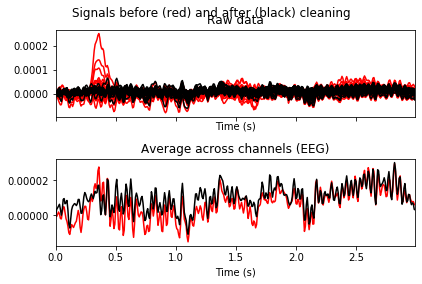

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\029_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\029_after_ica.fif [done]
Done!


In [21]:
subject = '029'
ECG_list = []
noise_list = [0, 1, 3, 8, 13, 31, 32, 35] # eye: 0, 1, 8; muscle: 13, 32; noise: 3, 31, 35
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 030 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/030_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 671359 =      0.000 ...  5244.992 secs
Ready.
Reading 0 ... 671359  =      0.000 ...  5244.992 secs...
Reading F:/HoltLab/data/ica/030_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

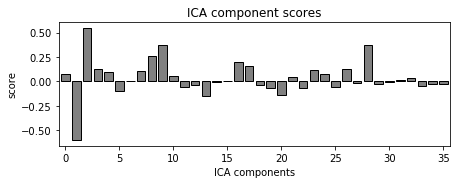

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

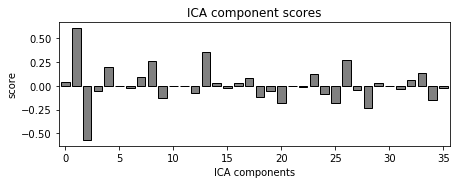

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

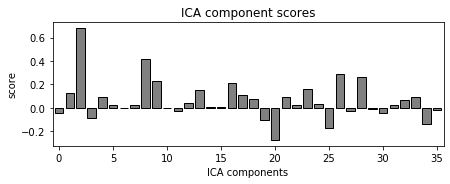

# Exclude EOG: {1, 2}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 2}
# Exclude list: [0, 1, 2, 3, 35, 9, 13, 22, 28]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components


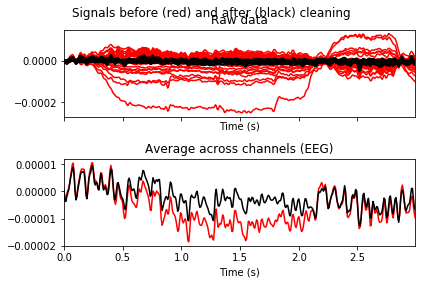

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 9 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\030_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\030_after_ica.fif [done]
Done!


In [25]:
subject = '030'
ECG_list = []
noise_list = [0, 3, 9, 13, 22, 28, 35] # eye: 0, 3, 22; muscle: 9, 13; noise: 28, 35
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 031 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/031_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 777471 =      0.000 ...  6073.992 secs
Ready.
Reading 0 ... 777471  =      0.000 ...  6073.992 secs...
Reading F:/HoltLab/data/ica/031_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

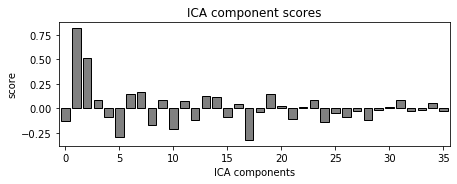

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

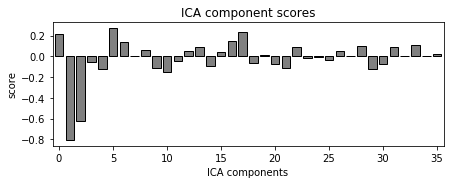

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

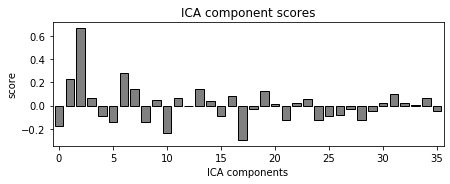

# Exclude EOG: {1, 2}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {1, 2}
# Exclude list: [0, 1, 2, 35, 4, 5, 6, 7, 12, 16]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 10 ICA components


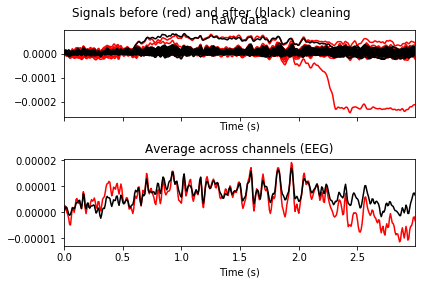

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 10 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\031_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\031_after_ica.fif [done]
Done!


In [31]:
subject = '031'
ECG_list = []
noise_list = [0, 4, 5, 6, 7, 12, 16, 35] # eye: 0, 5; muscle: 7, 12, 16; noise: 4, 6, 35
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 032 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/032_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 663551 =      0.000 ...  5183.992 secs
Ready.
Reading 0 ... 663551  =      0.000 ...  5183.992 secs...
Reading F:/HoltLab/data/ica/032_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

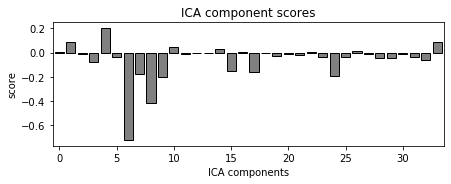

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

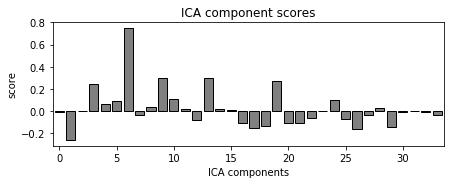

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

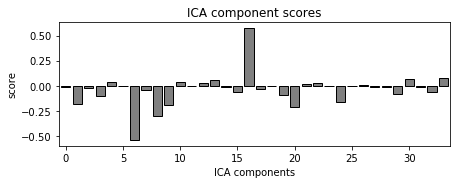

# Exclude EOG: {8, 16, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {8, 16, 6}
# Exclude list: [0, 1, 2, 6, 8, 16, 18, 19, 20, 24, 30]
# Visualizing noise reduction...
Transforming to ICA space (34 components)
Zeroing out 11 ICA components


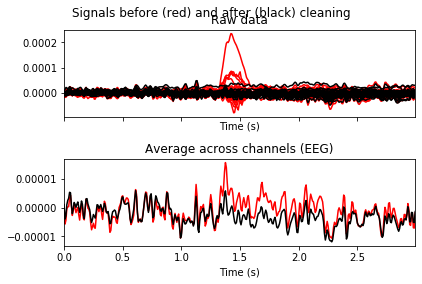

# Saving the updated data...
Transforming to ICA space (34 components)
Zeroing out 11 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\032_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\032_after_ica.fif [done]
Done!


In [37]:
subject = '032'
ECG_list = []
noise_list = [0, 1, 2, 18, 19, 20, 24, 30] # eye: 24; muscle: 18, 19, 20; noise: 0, 1, 2, 14, 30; 
reject(subject, EOG_channels, ECG_list, noise_list)

##### Processing subject 033 ...
# Reading Raw and ICA data...
Opening raw data file F:/HoltLab/data/filtered_raw/033_filtered_raw.fif...
Isotrak not found
    Range : 0 ... 650495 =      0.000 ...  5081.992 secs
Ready.
Reading 0 ... 650495  =      0.000 ...  5081.992 secs...
Reading F:/HoltLab/data/ica/033_ica.fif ...
Now restoring ICA solution ...
Ready.
# Running auto detection...
# Finding ICs that match patterns in EOG channels...
Using channel EXG3 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering

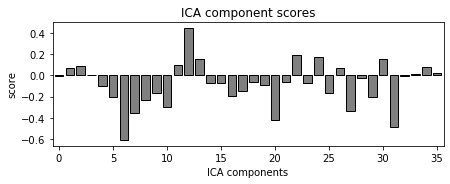

Using channel EXG4 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

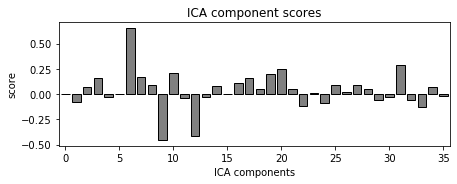

Using channel EXG5 as EOG channel
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2048 samples (16.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency:

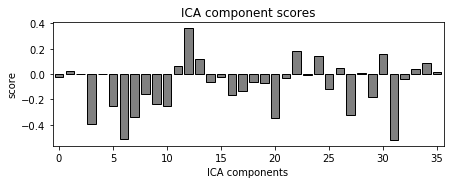

# Exclude EOG: {9, 6}
# Finding ICs that match patterns in ECG channels...
# Exclude ECG: set()
# Auto Exclude: {9, 6}
# Exclude list: [1, 2, 3, 4, 35, 6, 7, 9, 12, 14, 18, 20, 28, 31]
# Visualizing noise reduction...
Transforming to ICA space (36 components)
Zeroing out 14 ICA components


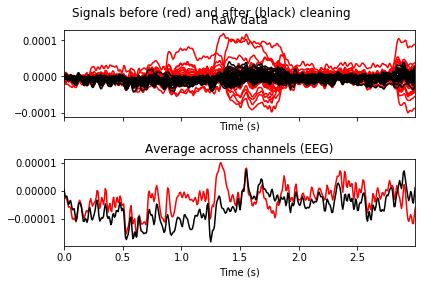

# Saving the updated data...
Transforming to ICA space (36 components)
Zeroing out 14 ICA components
Overwriting existing file.
Writing F:\HoltLab\data\raw_after_ica\033_after_ica.fif
Closing F:\HoltLab\data\raw_after_ica\033_after_ica.fif [done]
Done!


In [46]:
subject = '033'
ECG_list = []
noise_list = [1, 2, 3, 4, 6, 7, 12, 14, 18, 20, 28, 31, 35] # eye: 2, 3, 6, 7, 12, 20, 31, 35; muscle: 1, 4, 18, 28; noise: 14
reject(subject, EOG_channels, ECG_list, noise_list)